In [150]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
from datetime import datetime

# Understanding the Data

In [152]:
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d')

In [153]:
df=pd.read_csv('twins_1991-1997.csv',parse_dates=[['year','month','day']],date_parser=convert_to_date,keep_date_col=True)

C:\Users\DELL\AppData\Local\Temp\ipykernel_3724\2719931546.py:1: FutureWarning:

The argument 'date_parser' is deprecated and will be removed in a future version. Please use 'date_format' instead, or read your data in as 'object' dtype and then call 'to_datetime'.



In [154]:
df.head()

,year_month_day,year,month,day,latitude,longitude,zon.winds,mer.winds,humidity,air temp.,s.s.temp.
0,1991-01-01,1991,1,1,-5.03,165.00,1.1,-0.4,NaN,27.48,29.84
1,1991-01-01,1991,1,1,-0.01,-140.20,-8.2,-0.5,82.4,26.20,26.05
2,1991-01-01,1991,1,1,5.00,-110.00,-3.1,4.9,NaN,25.69,27.23
3,1991-01-01,1991,1,1,-2.01,-109.94,-6.0,4.7,NaN,23.94,24.05
4,1991-01-01,1991,1,1,2.02,-110.10,NaN,NaN,NaN,24.56,25.44


In [155]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 83758 entries, 0 to 83757
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   year_month_day  83758 non-null  datetime64[ns]
 1   year            83758 non-null  object        
 2   month           83758 non-null  object        
 3   day             83758 non-null  object        
 4   latitude        83758 non-null  float64       
 5   longitude       83758 non-null  float64       
 6   zon.winds       72535 non-null  float64       
 7   mer.winds       72535 non-null  float64       
 8   humidity        65025 non-null  float64       
 9   air temp.       77841 non-null  float64       
 10  s.s.temp.       83758 non-null  float64       
dtypes: datetime64[ns](1), float64(7), object(3)
memory usage: 7.0+ MB


In [156]:
df.describe()

,year_month_day,latitude,longitude,zon.winds,mer.winds,humidity,air temp.,s.s.temp.
count,83758,83758.000000,83758.000000,72535.000000,72535.000000,65025.000000,77841.000000,83758.000000
mean,1994-06-05 04:56:14.521836800,0.466012,-52.918774,-3.462446,0.185171,81.240957,26.915275,27.806732
min,1991-01-01 00:00:00,-8.810000,-180.000000,-12.400000,-10.800000,54.000000,17.920000,18.190000
25%,1993-03-13 00:00:00,-2.030000,-155.000000,-5.900000,-1.800000,77.600000,26.100000,26.900000
50%,1994-07-12 00:00:00,0.020000,-124.400000,-4.200000,0.200000,81.200000,27.330000,28.330000
75%,1995-09-30 00:00:00,4.990000,147.000000,-1.600000,2.100000,84.800000,28.160000,29.280000
max,1996-12-31 00:00:00,9.050000,171.100000,12.500000,11.000000,99.900000,31.480000,31.270000
std,NaN,4.776370,136.638458,3.270066,2.870448,5.380530,1.776979,2.001202


In [157]:
df.corr()

,year_month_day,year,month,day,latitude,longitude,zon.winds,mer.winds,humidity,air temp.,s.s.temp.
year_month_day,1.000000,0.983063,0.123645,0.014292,0.007490,-0.084172,-0.118116,-0.000034,-0.064709,-0.112509,-0.123353
year,0.983063,1.000000,-0.059660,-0.002742,0.009857,-0.083367,-0.128731,-0.041799,-0.037451,-0.089995,-0.107599
month,0.123645,-0.059660,1.000000,0.009231,-0.012189,-0.006866,0.053777,0.225773,-0.138639,-0.126219,-0.088749
day,0.014292,-0.002742,0.009231,1.000000,-0.004389,-0.003291,0.009522,0.001588,-0.005874,-0.007495,-0.004897
latitude,0.007490,0.009857,-0.012189,-0.004389,1.000000,0.055670,0.134715,-0.019697,0.169953,0.068463,0.123694
longitude,-0.084172,-0.083367,-0.006866,-0.003291,0.055670,1.000000,0.434525,-0.064750,-0.038373,0.311591,0.398434
zon.winds,-0.118116,-0.128731,0.053777,0.009522,0.134715,0.434525,1.000000,0.081415,0.063807,0.221617,0.360665
mer.winds,-0.000034,-0.041799,0.225773,0.001588,-0.019697,-0.064750,0.081415,1.000000,0.122416,-0.374437,-0.317619
humidity,-0.064709,-0.037451,-0.138639,-0.005874,0.169953,-0.038373,0.063807,0.122416,1.000000,-0.410395,-0.355634
air temp.,-0.112509,-0.089995,-0.126219,-0.007495,0.068463,0.311591,0.221617,-0.374437,-0.410395,1.000000,0.941705


In [158]:
df[df['air temp.'].isnull()]

,year_month_day,year,month,day,latitude,longitude,zon.winds,mer.winds,humidity,air temp.,s.s.temp.
5,1991-01-01,1991,1,1,0.01,165.00,NaN,NaN,NaN,NaN,29.42
12,1991-01-02,1991,1,2,0.01,165.00,NaN,NaN,NaN,NaN,29.67
30,1991-01-03,1991,1,3,0.01,165.00,NaN,NaN,NaN,NaN,29.66
38,1991-01-04,1991,1,4,0.01,165.00,NaN,NaN,NaN,NaN,29.62
44,1991-01-05,1991,1,5,0.01,165.00,NaN,NaN,NaN,NaN,29.53
...,...,...,...,...,...,...,...,...,...,...,...
83710,1996-12-30,1996,12,30,2.00,147.00,NaN,NaN,NaN,NaN,29.56
83738,1996-12-31,1996,12,31,-4.99,165.20,NaN,NaN,NaN,NaN,29.38
83743,1996-12-31,1996,12,31,0.10,-95.20,0.1,1.9,97.6,NaN,21.06
83751,1996-12-31,1996,12,31,-2.04,-124.94,-5.0,1.2,NaN,NaN,23.70


In [159]:
df=df.dropna(subset=['air temp.'])

In [160]:
df.count()

year_month_day    77841
year              77841
month             77841
day               77841
latitude          77841
longitude         77841
zon.winds         68644
mer.winds         68644
humidity          63388
air temp.         77841
s.s.temp.         77841
dtype: int64

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



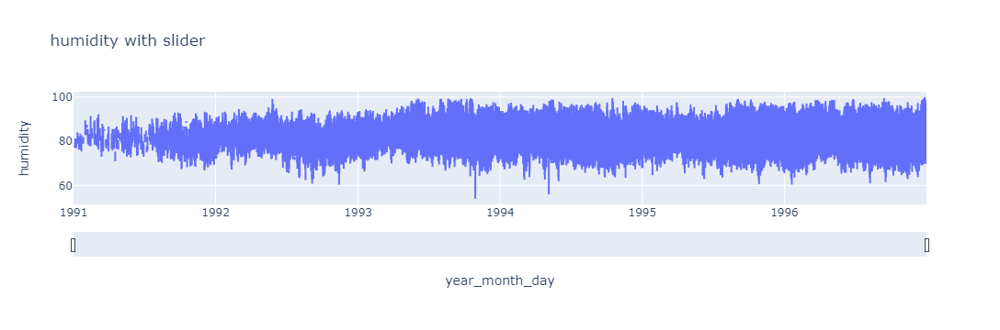

In [161]:
import plotly.express as px

fig = px.line(df,x='year_month_day',y='humidity',title='humidity with slider')

fig.update_xaxes(
    rangeslider_visible=True,
)
fig.show()

C:\Users\DELL\anaconda3\Lib\site-packages\_plotly_utils\basevalidators.py:106: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



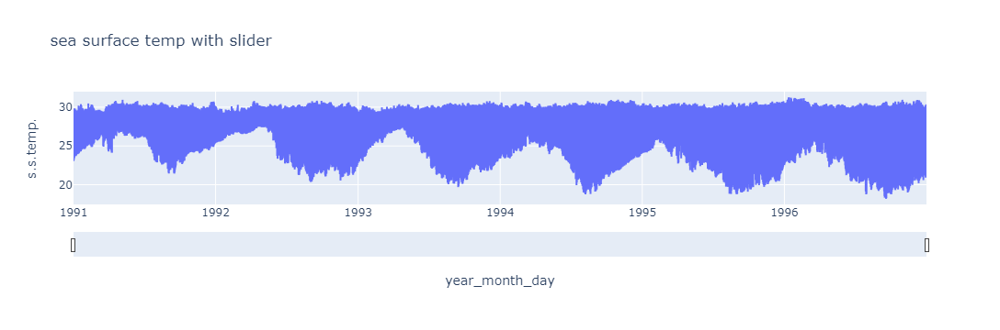

In [162]:

fig = px.line(df,x='year_month_day',y='s.s.temp.',title='sea surface temp with slider')

fig.update_xaxes(
    rangeslider_visible=True,
)
fig.show()

<Axes: xlabel='latitude', ylabel='Count'>

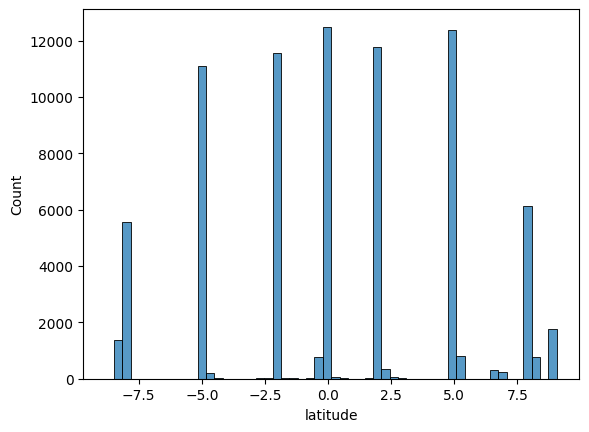

In [163]:
sns.histplot(df['latitude'])

<Axes: xlabel='longitude', ylabel='Count'>

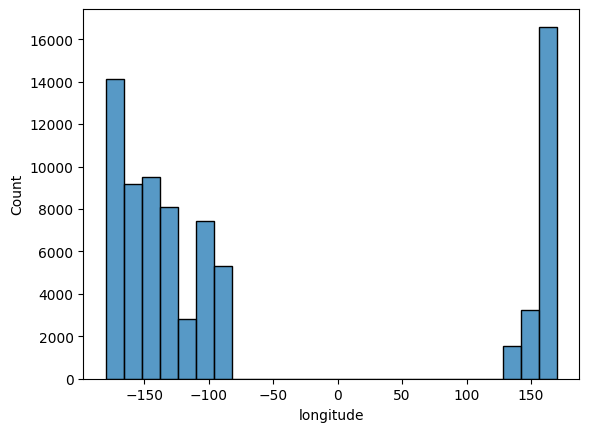

In [164]:
sns.histplot(df['longitude'])

<Axes: xlabel='zon.winds', ylabel='Count'>

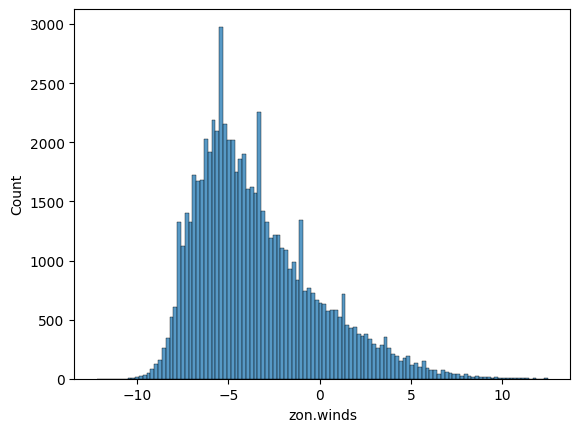

In [165]:
sns.histplot(df['zon.winds'])

<Axes: xlabel='mer.winds', ylabel='Count'>

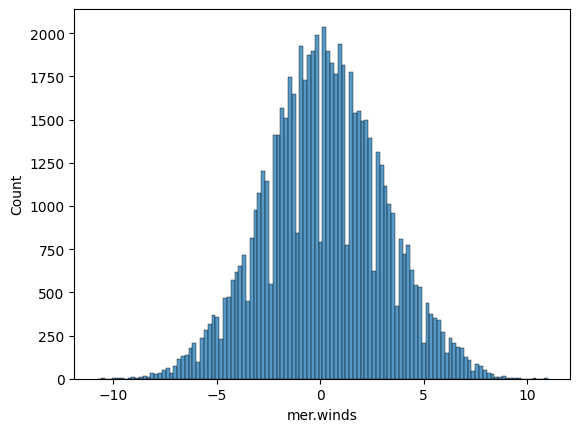

In [166]:
sns.histplot(df['mer.winds'])

<Axes: xlabel='humidity', ylabel='Count'>

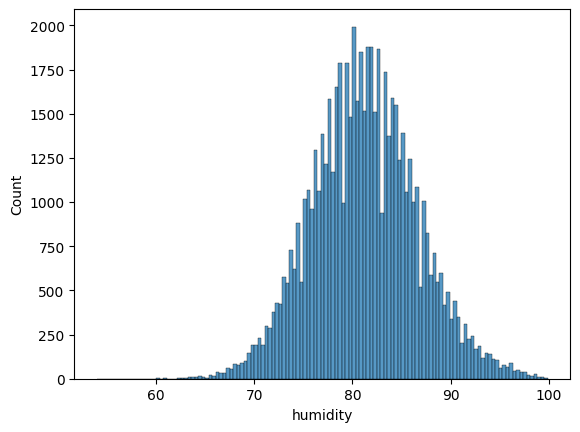

In [167]:
sns.histplot(df['humidity'])

<Axes: xlabel='air temp.', ylabel='Count'>

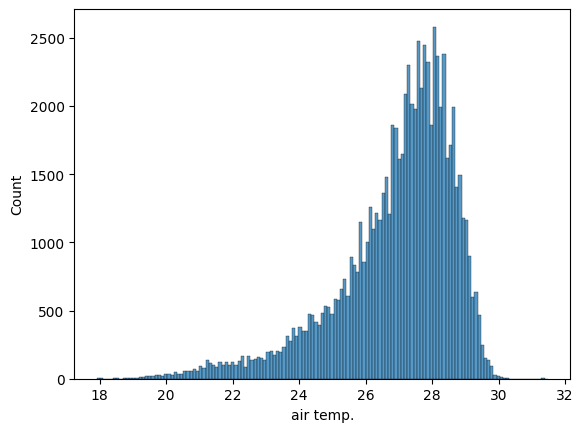

In [168]:
sns.histplot(df['air temp.'])

<Axes: xlabel='s.s.temp.', ylabel='Count'>

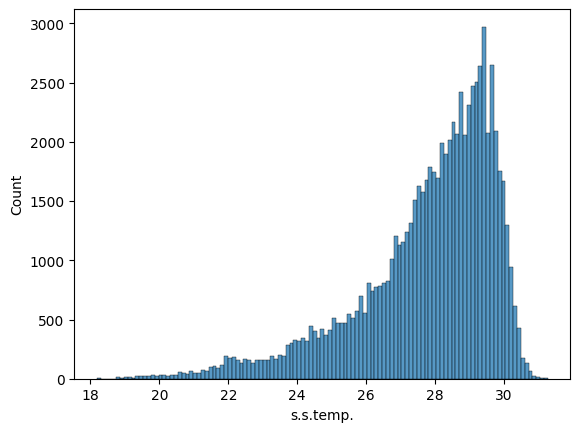

In [169]:
sns.histplot(df['s.s.temp.'])

# Filling the Data

In [171]:
df_new=df.copy()

In [172]:
df_new=df_new.sort_values(by=['s.s.temp.'],ascending=[True])
df_new.head(10000)

,year_month_day,year,month,day,latitude,longitude,zon.winds,mer.winds,humidity,air temp.,s.s.temp.
78759,1996-09-18,1996,9,18,0.02,-95.10,-3.8,3.4,97.6,17.92,18.19
78774,1996-09-19,1996,9,19,0.02,-95.10,-3.5,4.6,97.6,18.05,18.27
78615,1996-09-15,1996,9,15,0.02,-95.10,-1.2,4.5,96.0,18.11,18.33
78679,1996-09-17,1996,9,17,0.01,-95.10,-4.1,2.6,95.6,18.27,18.48
78572,1996-09-14,1996,9,14,0.02,-95.10,-3.6,4.4,97.2,18.00,18.55
...,...,...,...,...,...,...,...,...,...,...,...
34475,1994-01-21,1994,1,21,-8.02,-109.94,-6.6,2.1,82.8,25.08,25.45
50727,1995-01-13,1995,1,13,-1.98,-95.00,-2.3,5.7,NaN,25.34,25.45
3636,1991-09-09,1991,9,9,0.00,-140.00,-4.1,-0.6,85.4,24.56,25.45
13468,1992-08-28,1992,8,28,-5.05,-124.90,-6.7,1.1,81.6,25.58,25.45


In [173]:
df_new['humidity']=df_new['humidity'].interpolate()
df_new.count()

year_month_day    77841
year              77841
month             77841
day               77841
latitude          77841
longitude         77841
zon.winds         68644
mer.winds         68644
humidity          77841
air temp.         77841
s.s.temp.         77841
dtype: int64

In [95]:
df_new['zon.winds'].fillna(np.random.normal(df_new['zon.winds'].mean(),df_new['zon.winds'].std()),inplace=True)
df_new['mer.winds'].fillna(np.random.normal(df_new['mer.winds'].mean(),df_new['mer.winds'].std()),inplace=True)

df_new.count()

year_month_day    77841
year              77841
month             77841
day               77841
latitude          77841
longitude         77841
zon.winds         77841
mer.winds         77841
humidity          77841
air temp.         77841
s.s.temp.         77841
dtype: int64

# Transforming the data

<Axes: xlabel='s.s.temp.', ylabel='Count'>

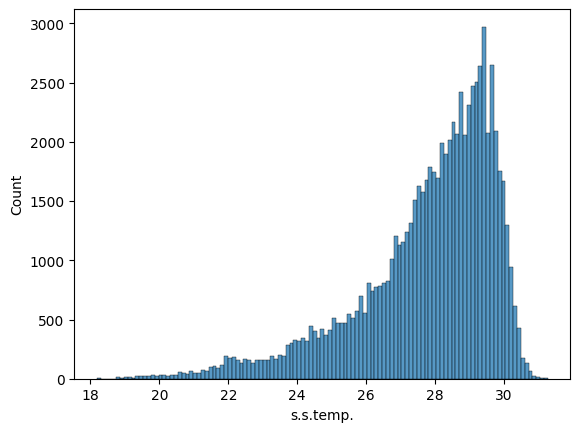

In [197]:
sns.histplot(df_new['s.s.temp.'])

{'whiskers': [<matplotlib.lines.Line2D at 0x221c52621d0>,
 'caps': [<matplotlib.lines.Line2D at 0x221c63e2e10>,
 'boxes': [<matplotlib.lines.Line2D at 0x221a86fae10>],
 'medians': [<matplotlib.lines.Line2D at 0x221c63e3dd0>],
 'fliers': [<matplotlib.lines.Line2D at 0x221c6390690>],
 'means': []}

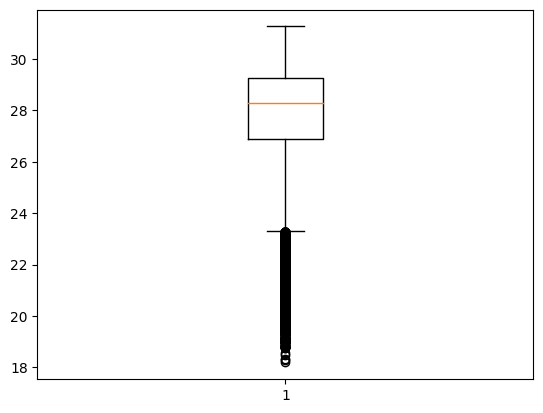

In [211]:
plt.boxplot(df_new['s.s.temp.'])